<a href="https://colab.research.google.com/github/wtzheng99/EC500_Project7/blob/main/classification_and_clustering/classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# For running in Colab
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
! cp /content/drive/MyDrive/EC500_Project/clustering_and_classification/updated_annotations.csv /content
! cp -r /content/drive/MyDrive/EC500_Project/clustering_and_classification/wsi /content

In [4]:
!apt update && apt install -y openslide-tools
!pip install -q openslide-python

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [825 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 1,059 kB in 3s (352 kB/s)
Reading package lists... Done
Building dependency tree... Done
Reading state information... 

In [32]:
import torch
import pandas as pd
import numpy as np
import random

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from scipy.special import logit
from sklearn.preprocessing import StandardScaler, RobustScaler, PowerTransformer, QuantileTransformer, Normalizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm
from sklearn.svm import SVC
from sklearn.model_selection import KFold, cross_val_score
from sklearn import metrics
from sklearn.multiclass import OneVsRestClassifier

from openslide import OpenSlide
from PIL import Image
from itertools import cycle

Because the dataset on counts are discrete, we are doing classification to predict levels. Before doing so, we are doing z-scoring to check for any anomalies in the dataset.

In [6]:
file_path = "./updated_annotations.csv"
df = pd.read_csv(file_path)

# Normalizing cell count in dataset
cell_types = ['Epithelial', 'Lymphocyte', 'Macrophage', 'Neutrophil']
for cell_type in cell_types:
  df[f'{cell_type}_normalized'] = df[cell_type] / df[cell_types].sum(axis=1)

normalized_df = df[['level', 'filename', 'Epithelial_normalized',
                    'Lymphocyte_normalized', 'Macrophage_normalized', 'Neutrophil_normalized']]

features = normalized_df[['Epithelial_normalized', 'Lymphocyte_normalized',
                          'Macrophage_normalized', 'Neutrophil_normalized']]
levels = normalized_df['level']

In [7]:
random.seed(42)

In [9]:
# Splitting dataset into training, testing, and validation (80%, 10%, 10%)
X_train, X_temp, y_train, y_temp = train_test_split(features, levels, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Checking dataset split
total_data = len(X_train) + len(X_test) + len(X_val)

print("Size of dataset: ", total_data)
print("Size of Training data (%): ", (len(X_train) / total_data) * 100)
print("Size of Testing data (%): ", (len(X_test) / total_data) * 100)
print("Size of Validation data (%): ", (len(X_val) / total_data) * 100)


Size of dataset:  386
Size of Training data (%):  79.79274611398964
Size of Testing data (%):  10.103626943005182
Size of Validation data (%):  10.103626943005182


# **Visualizing Dataset:**
We can conclude that the dataset is discrete

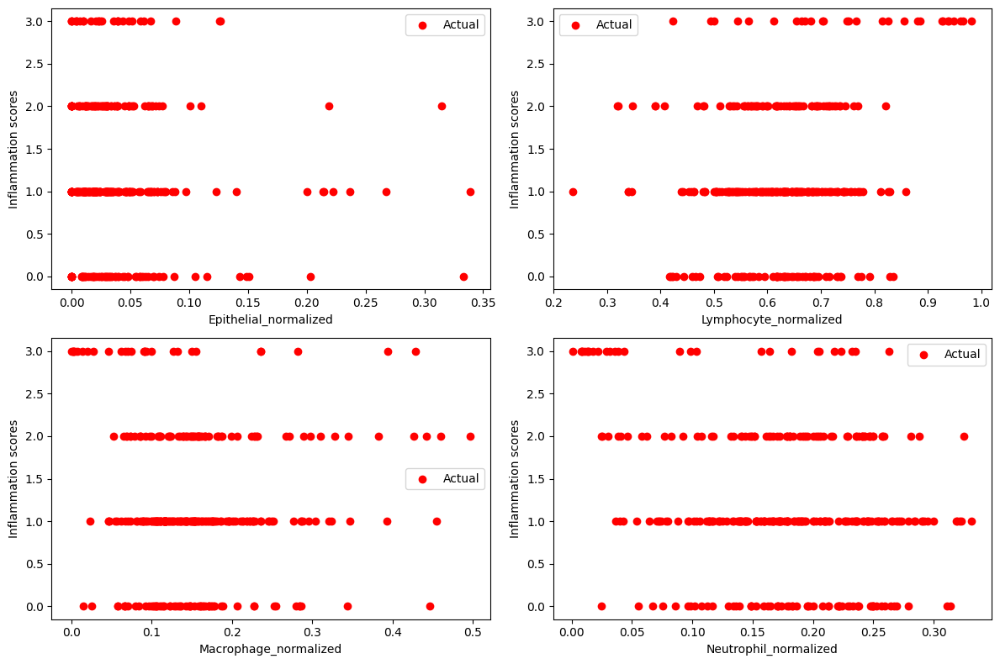

In [42]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot each feature against the target variable
for i, feature in enumerate(['Epithelial_normalized', 'Lymphocyte_normalized', 'Macrophage_normalized', 'Neutrophil_normalized']):
    row = i // 2
    col = i % 2
    axs[row, col].scatter(X_train[feature], y_train, color="red", label="Actual")
    # axs[row, col].plot(X_train[feature], train_pred, color="blue", label="Predicted")
    axs[row, col].set_xlabel(feature)
    axs[row, col].set_ylabel('Inflammation scores')
    axs[row, col].legend()

plt.tight_layout()
plt.show()

# **Visualizing count ditribution and coloring based on z-score:**
Calculating z-scores for each cell type within each level of inflammation. This is such that we are standardizing cell counts to its relative mean and standard deviation that is within a specific level of inflammation

We are using normalized data to standardize the distribution of each cell types.

In [44]:
cell_types = ['Epithelial_normalized', 'Lymphocyte_normalized', 'Macrophage_normalized', 'Neutrophil_normalized']
group_name = 'level'

def calculate_z_scores(group):
  mean = group[cell_types].mean()
  std = group[cell_types].std()
  z_scores_group = (group[cell_types] - mean) / std

  return z_scores_group

z_scores = normalized_df.groupby('level',  group_keys=True).apply(calculate_z_scores)
z_scores.reset_index(inplace=True)
# print(z_scores)

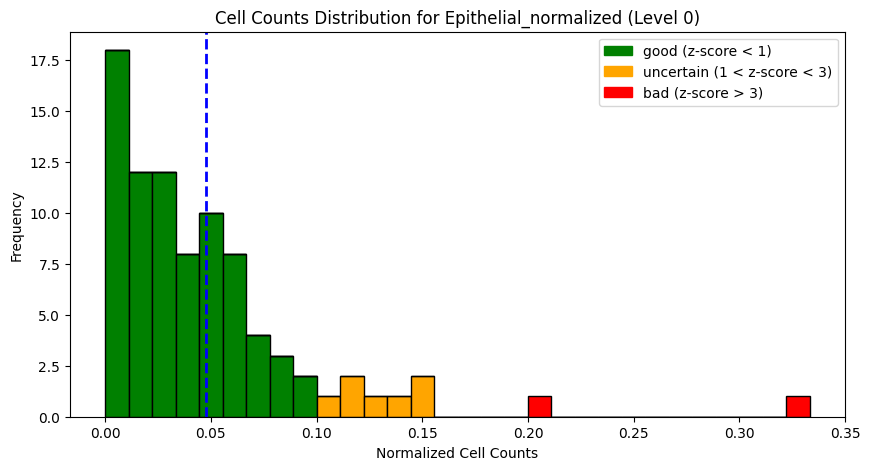

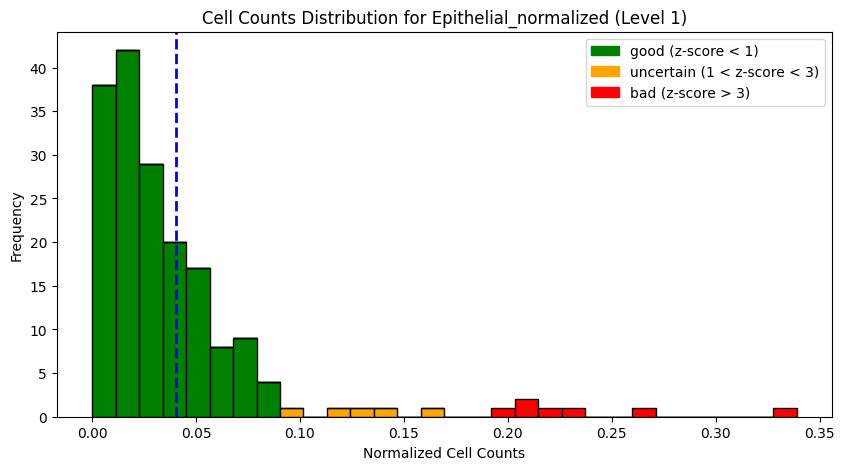

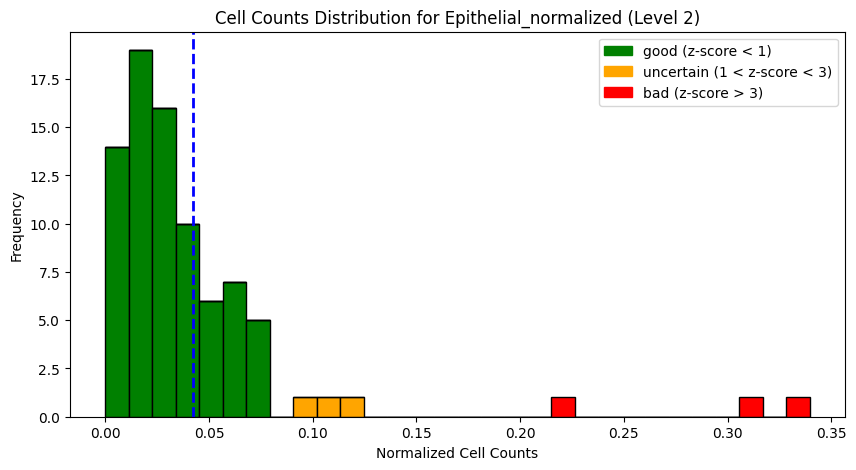

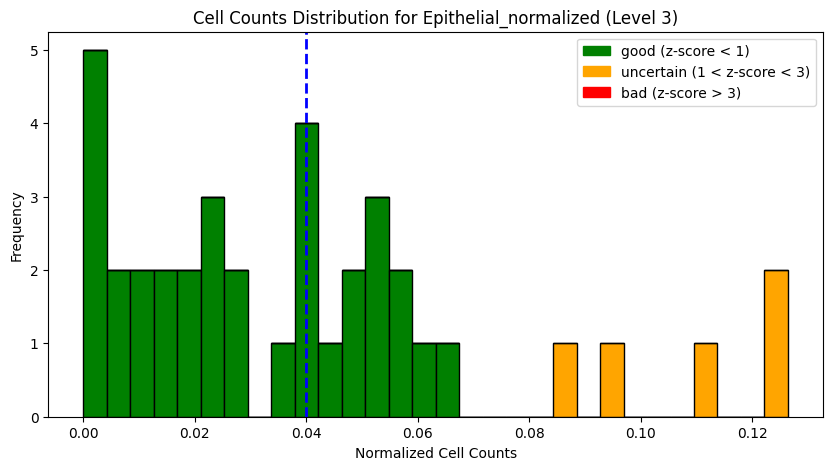

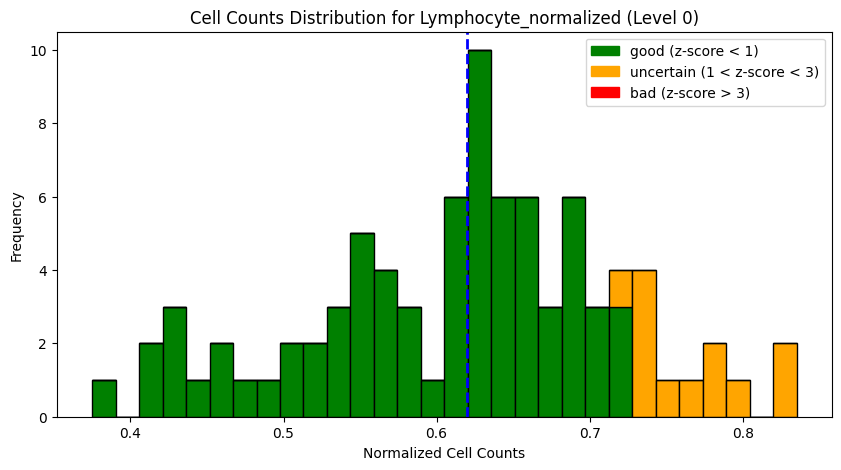

...

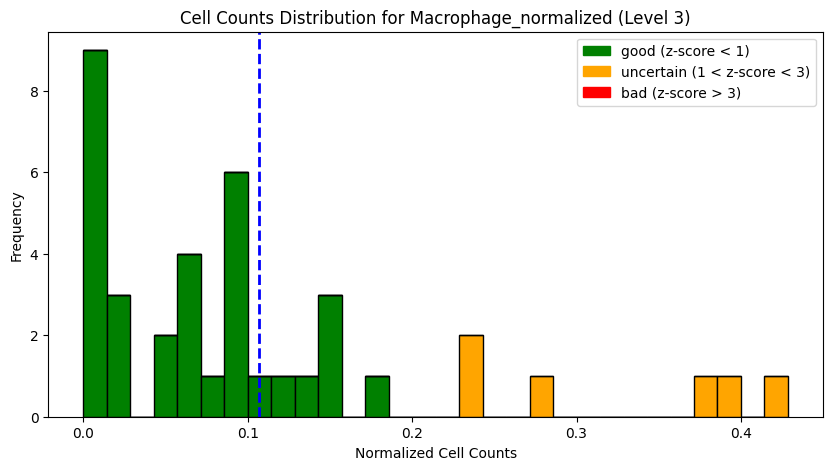

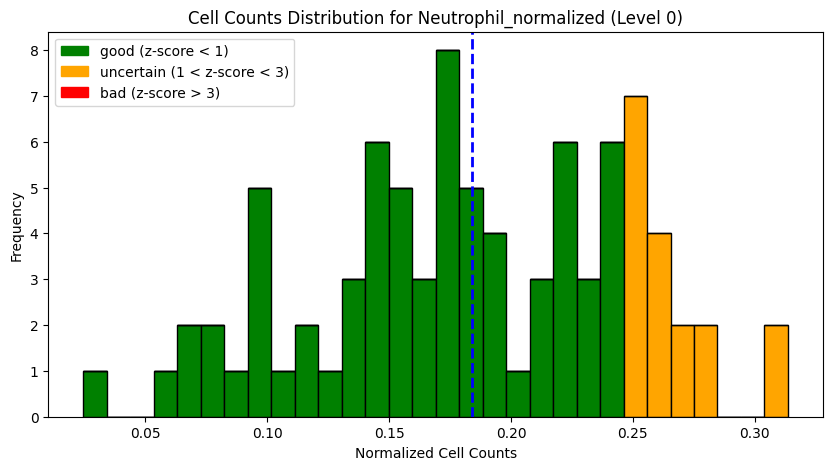

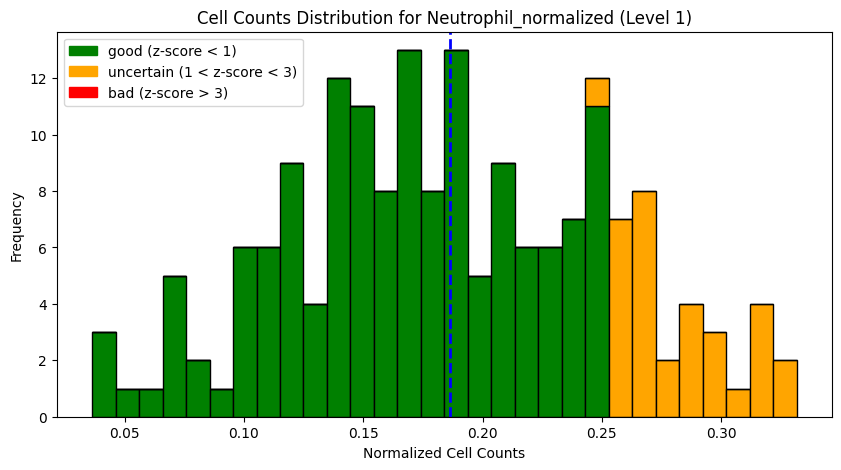

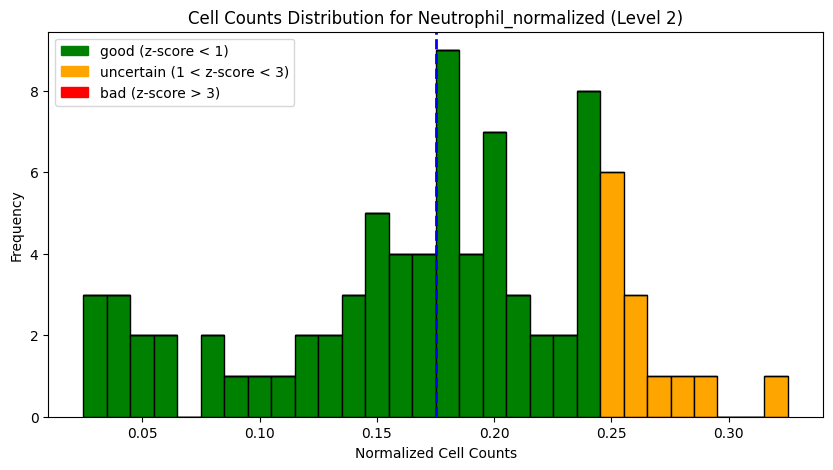

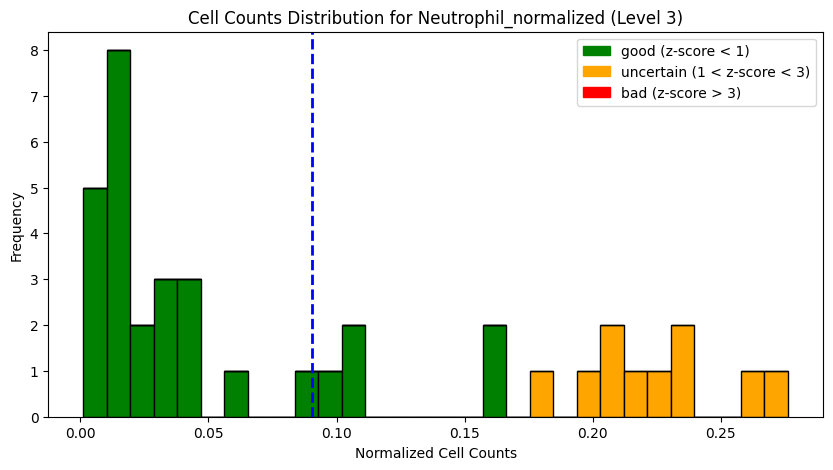

In [45]:
# Visualizing count distribution for each cell types for each levels
"""
The histograms are colored based on z-thresholds to visualize anomalies
or deviations from the mean.
z-score < 1 = normal data value
1 < z-score < 3 = could be an anomaly/error
z-score > 3 = anomaly/error
"""
z_score_thresholds = {
    'good (z-score < 1)': 1,
    'uncertain (1 < z-score < 3)': 3,
    'bad (z-score > 3)': float('inf')
}

threshold_colors = {
    'good (z-score < 1)': 'Green',
    'uncertain (1 < z-score < 3)': 'Orange',
    'bad (z-score > 3)': 'Red'
}

for cell_type in cell_types:
    for level in normalized_df['level'].unique():
        plt.figure(figsize=(10, 5))

        # Initializing empty lists to store cell counts for each category
        cell_counts = {category: [] for category in z_score_thresholds}

        # Selecting data for the current cell type and level
        data = normalized_df[normalized_df['level'] == level][cell_type]

        # Calculating z-scores for the current cell type and level
        z_scores = (data - data.mean()) / data.std()

        # Group cell counts  based on z-score thresholds
        for category, threshold in z_score_thresholds.items():
            if category == 'good (z-score < 1)':
                selected_counts = data.loc[z_scores < threshold]
            elif category == 'uncertain (1 < z-score < 3)':
                selected_counts = data.loc[(z_scores >= z_score_thresholds['good (z-score < 1)']) & (z_scores <= threshold)]  # For 'uncertain', z-score is between 1 and 3
            else:
                selected_counts = data.loc[z_scores > z_score_thresholds['uncertain (1 < z-score < 3)']]  # For 'error', z-score is greater than 3

            cell_counts[category].extend(selected_counts)

        plt.hist(cell_counts.values(), color=[threshold_colors[category] for category in z_score_thresholds.keys()], label=z_score_thresholds.keys(), edgecolor='black', bins=30, histtype='barstacked')

        # Vertical dotted line to represent mean
        mean_count = data.mean()
        plt.axvline(x=mean_count, color='blue', linestyle='--', linewidth=2, label=f'Mean {cell_type}')
        plt.title(f"Cell Counts Distribution for {cell_type} (Level {level})")
        plt.xlabel("Normalized Cell Counts")
        plt.ylabel("Frequency")

        # Legends for z-score thresholds
        patches = [mpatches.Patch(color=threshold_colors[category], label=category) for category in z_score_thresholds.keys()]
        plt.legend(handles=patches)

        plt.show()

# **Classification Task:**
After normalizing dataset, each patch/file will be have cell counts that sums to 1. We are only doing classification on the annotated dataset.

1) Do Logit function on each of the patches

2) Classification on 1)

3) Create whole slide map of clusters -- try different methods and **parameters**


In [36]:
def visualize_classification(path_wsi, true_labels, pred_labels, x_y, level=2, fig_title='Title'):
  fig, axs = plt.subplots(1, 2, figsize=(16, 6))

  # Plot ground truth labels
  wsi = OpenSlide(path_wsi)
  wsi_width, wsi_height = wsi.dimensions

  # Downsampling wsi according to specified level
  downsampled_width = wsi.level_dimensions[level][0]
  downsampled_height = wsi.level_dimensions[level][1]
  downsampled_wsi = wsi.read_region((0, 0), level, (downsampled_width, downsampled_height))

  axs[0].imshow(downsampled_wsi)
  for inflammation_level in range(4):
    indices = true_labels == inflammation_level

    x_vals = (x_y[indices].str.split('_').str[0].astype(int)) * 512
    y_vals = (x_y[indices].str.split('_').str[1].astype(int)) * 512
    scaled_x = x_vals * downsampled_height / wsi_height
    scaled_y = y_vals * downsampled_width / wsi_width

    axs[0].scatter(scaled_y, scaled_x, label=f'Level {inflammation_level}', alpha=0.5)
  axs[0].set_title('Ground Truth Labels')
  axs[0].legend()
  axs[0].grid(False)

  # Plot predicted labels
  axs[1].imshow(downsampled_wsi)

  for inflammation_level in range(4):
    indices = pred_labels == inflammation_level
    x_vals = (x_y[indices].str.split('_').str[0].astype(int)) * 512
    y_vals = (x_y[indices].str.split('_').str[1].astype(int)) * 512
    scaled_x = x_vals * downsampled_height / wsi_height
    scaled_y = y_vals * downsampled_width / wsi_width

    axs[1].scatter(scaled_y, scaled_x, label=f'Level {inflammation_level}', alpha=0.5)

  axs[1].set_title('Predicted Labels')
  axs[1].legend()
  axs[1].grid(False)

  plt.suptitle(f"Classification Results on {fig_title}")
  plt.show()

  return


def calculate_and_visualize_metrics(y_truth, y_pred, algorithm, auprc=False):
  accuracy = accuracy_score(y_truth, y_pred)
  conf_matrix = confusion_matrix(y_truth, y_pred)
  clf_report = classification_report(y_truth, y_pred, zero_division=1)

  # Visualizing classification
  plt.figure(figsize=(5, 4))
  plt.scatter(y_truth, y_pred, color="blue")
  plt.plot([y_truth.min(), y_truth.max()], [y_truth.min(), y_truth.max()], lw=2) # perfect prediction
  plt.xlabel("Actual Inflammation Level")
  plt.ylabel("Predicted Inflammation Level")
  plt.title(f"{algorithm} Classifier")
  plt.grid(True)
  plt.show()

  # print("y_truth: ", y_truth)
  # print("y_pred: ", y_pred)

  return accuracy, conf_matrix, clf_report


def perform_cross_validation(X, y, clf, cv=5):
  k_folds = KFold(n_splits=cv, random_state=1, shuffle=True)
  scores = cross_val_score(clf, X, y, cv=k_folds, scoring='accuracy', n_jobs=-1)

  print(f"Cross-Validation Scores: {scores}")
  print(f"Mean Accuracy: {scores.mean():.4f}")
  print(f"Standard Deviation: {scores.std():.4f}")
  return


def read_file_and_classify(counts_file, algorithm='KNN', n_neighbors=4, cv=False):
  # Threshold value to avoid extreme values, ensuring 0 < p < 1 when doing Logits
  epsilon = 1e-10

  # Read counts file and normalize cell counts for each patches
  df = pd.read_csv(counts_file)

  cell_types = ['Epithelial', 'Lymphocyte', 'Macrophage', 'Neutrophil']
  for cell_type in cell_types:
    df[f'{cell_type}_normalized'] = df[cell_type] / df[cell_types].sum(axis=1)

  normalized_df = df[['filename', 'x_y', 'level', 'Epithelial_normalized',
                      'Lymphocyte_normalized', 'Macrophage_normalized',
                      'Neutrophil_normalized']]

  # Apply Logit on each patches
  patches = normalized_df[['Epithelial_normalized', 'Lymphocyte_normalized',
                             'Macrophage_normalized', 'Neutrophil_normalized']]

  logit_patches = patches.applymap(lambda x: logit(min(max(x, epsilon), 1 - epsilon)))

  df_logits = pd.concat([logit_patches, normalized_df[['filename', 'x_y', 'level']]], axis=1)
  # print(df_logits.head())

  # Extracting testing dataset from df_logits: case3, case4, control3 & control4 (~10% of total dataset)
  test_subsets = ['case3', 'case4', 'control3', 'control4']
  wsi_path_subsets = ['./wsi/Case3_GTEX-OHPJ-1026.svs', './wsi/Case4_GTEX-OXRP-0526.svs',
                      './wsi/Control3_GTEX-13CF2-0726.svs', './wsi/Control4_GTEX-145MG-1426.svs']

  testing_data = df_logits[df_logits['filename'].str.contains('|'.join(test_subsets))]
  training_data = df_logits[~df_logits['filename'].str.contains('|'.join(test_subsets))]

  # Shuffling training dataset
  training_data = training_data.sample(frac=1).reset_index(drop=True)

  # Extracting X and y values for training and testing
  X_train = training_data[['Epithelial_normalized', 'Lymphocyte_normalized', 'Macrophage_normalized', 'Neutrophil_normalized']]
  y_train = training_data['level']

  # X_test = testing_data[['Epithelial_normalized', 'Lymphocyte_normalized', 'Macrophage_normalized', 'Neutrophil_normalized']]
  # y_test = testing_data['level']

  if algorithm == 'LogisticRegression':
    clf_mode = LogisticRegression(class_weight=None, random_state=42, max_iter=10000)
  elif algorithm == 'QDA':
    clf_mode = QuadraticDiscriminantAnalysis(reg_param=0.0)
  elif algorithm == 'RandomForest':
    clf_mode = RandomForestClassifier(max_depth=10, n_estimators=100, criterion="gini",
                                      max_features=2, random_state=42)
  elif algorithm == 'KNN':
    clf_mode = KNeighborsClassifier(n_neighbors=n_neighbors, weights='distance')
  elif algorithm == 'SVM':
    clf_mode = svm.SVC(kernel="rbf", gamma=0.75, C=1.0) # alpha=1, max_iter=1000, random_state=42
  elif algorithm == 'DecisionTree':
    clf_mode = DecisionTreeClassifier(max_depth=15, max_features=4, class_weight=None, random_state=42)
  else:
      raise ValueError("Invalid classification algorithm specified.")

  # Training
  clf = clf_mode.fit(X_train, y_train)

  if cv==True:
    print("Performing Cross-Validation...")
    perform_cross_validation(X_train, y_train, clf_mode)
    print("\n")

  print(f"Classification mode: {algorithm}", "\n")

  train_accuracy = accuracy_score(y_train, clf.predict(X_train))
  print(f"Accuracy on training set: {train_accuracy}", "\n")

  # Prediction
  for subset, wsi_path_subset in zip(test_subsets, wsi_path_subsets):
    subset_data = df_logits[df_logits['filename'].str.contains(subset)]

    X_test = subset_data[['Epithelial_normalized', 'Lymphocyte_normalized',
                          'Macrophage_normalized', 'Neutrophil_normalized']]
    y_test = subset_data['level']

    x_y = subset_data['x_y']

    path_wsi = wsi_path_subset

    y_test_pred = clf.predict(X_test)

    # Visualize classification for the subset
    visualize_classification(path_wsi, y_test, y_test_pred, x_y, fig_title=subset)

    # Calculate and visualize metrics
    test_accuracy, test_conf_mat, test_clf_report = calculate_and_visualize_metrics(y_test, y_test_pred, algorithm, auprc=False)

    print(f"Accuracy on test set: {test_accuracy}", "\n")
    print(f"Confusion matrix on test set: \n {test_conf_mat}", "\n")
    print(f"Classification report on test set: \n {test_clf_report}", "\n")


  # Calculating and visualize metrics for X_test (all subsets)
  X_test_all_subsets = testing_data[['Epithelial_normalized', 'Lymphocyte_normalized',
                                     'Macrophage_normalized', 'Neutrophil_normalized']]
  y_test_all_subsets = testing_data['level']
  y_test_pred_all_subsets = clf.predict(X_test_all_subsets) # predict

  test_accuracy_all, test_conf_mat_all, test_clf_report_all = calculate_and_visualize_metrics(y_test_all_subsets,
                                                                                              y_test_pred_all_subsets,
                                                                                              algorithm, auprc=True)

  print(f"Accuracy on test set (all subsets): {test_accuracy_all}", "\n")
  print(f"Confusion matrix on test set (all subsets): \n {test_conf_mat_all}", "\n")
  print(f"Classification report on test set (all subsets): \n {test_clf_report_all}", "\n")

  return

# **Classification Results for Logistic Regression:**


Performing Cross-Validation...
Cross-Validation Scores: [0.51428571 0.53623188 0.50724638 0.49275362 0.49275362]
Mean Accuracy: 0.5087
Standard Deviation: 0.0161


Classification mode: LogisticRegression 

Accuracy on training set: 0.5086705202312138 



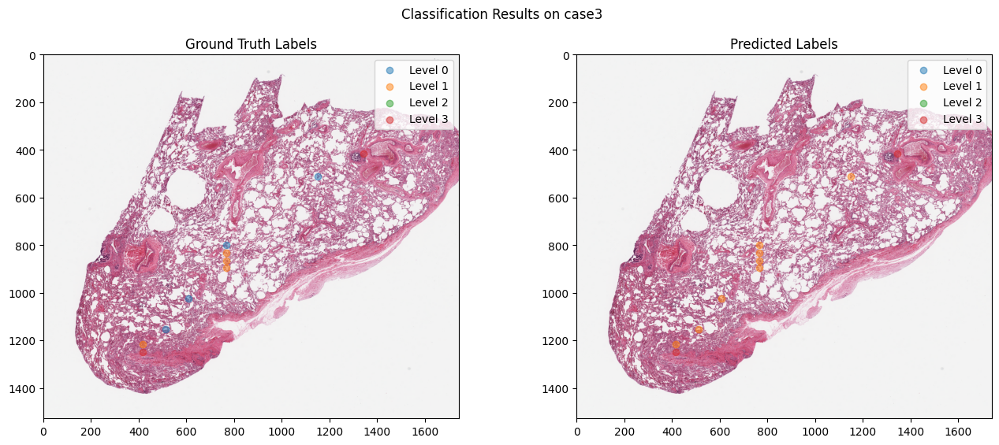

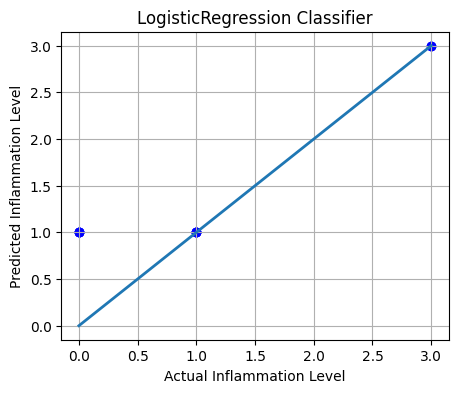

Accuracy on test set: 0.6 

Confusion matrix on test set: 
 [[0 4 0]
 [0 4 0]
 [0 0 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         4
           1       0.50      1.00      0.67         4
           3       1.00      1.00      1.00         2

    accuracy                           0.60        10
   macro avg       0.83      0.67      0.56        10
weighted avg       0.80      0.60      0.47        10
 



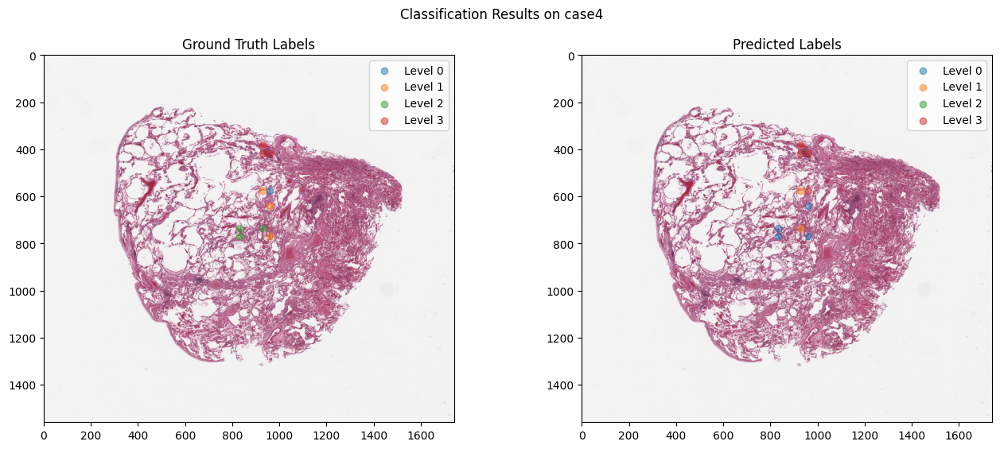

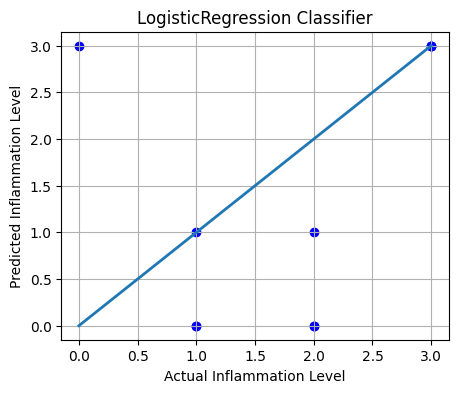

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[0 0 0 1]
 [2 1 0 0]
 [2 1 0 0]
 [0 0 0 3]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.50      0.33      0.40         3
           2       1.00      0.00      0.00         3
           3       0.75      1.00      0.86         3

    accuracy                           0.40        10
   macro avg       0.56      0.33      0.31        10
weighted avg       0.68      0.40      0.38        10
 



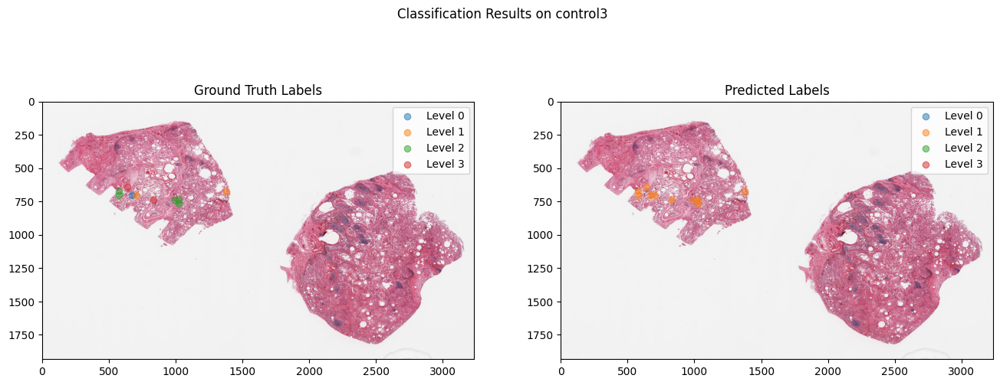

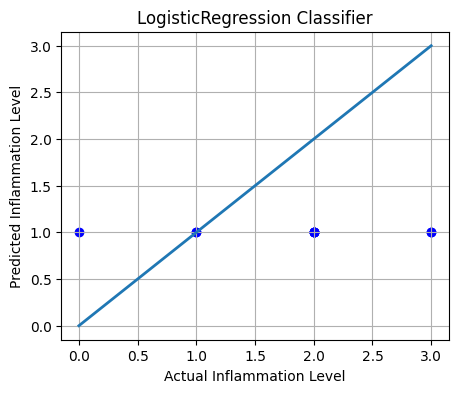

Accuracy on test set: 0.2 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [0 5 0 0]
 [0 2 0 0]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.20      1.00      0.33         2
           2       1.00      0.00      0.00         5
           3       1.00      0.00      0.00         2

    accuracy                           0.20        10
   macro avg       0.80      0.25      0.08        10
weighted avg       0.84      0.20      0.07        10
 



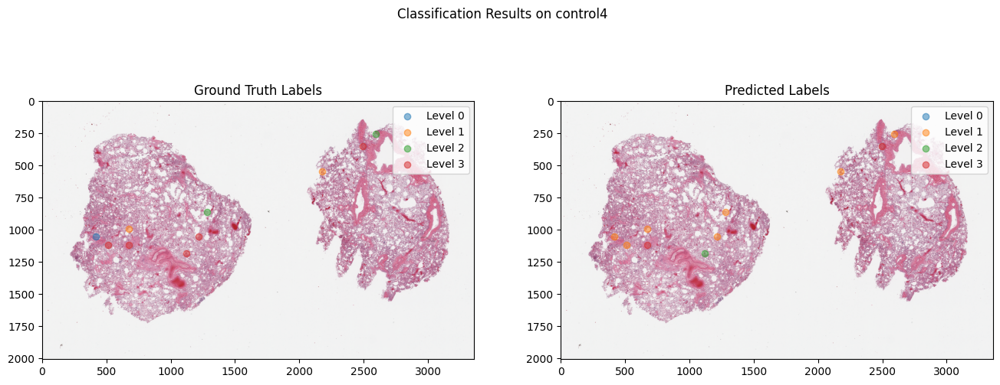

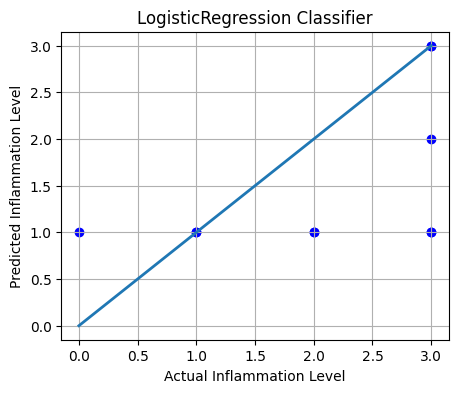

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [0 2 0 0]
 [0 2 1 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.29      1.00      0.44         2
           2       0.00      0.00      0.00         2
           3       1.00      0.40      0.57         5

    accuracy                           0.40        10
   macro avg       0.57      0.35      0.25        10
weighted avg       0.66      0.40      0.37        10
 



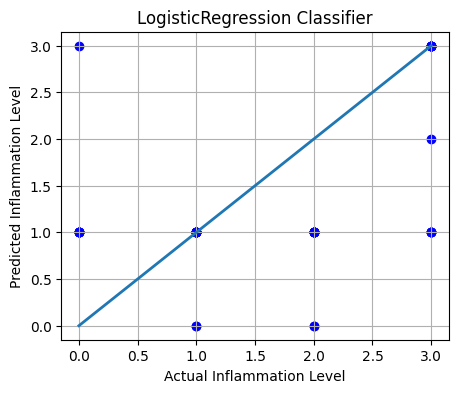

Accuracy on test set (all subsets): 0.4 

Confusion matrix on test set (all subsets): 
 [[0 6 0 1]
 [2 9 0 0]
 [2 8 0 0]
 [0 4 1 7]] 

Classification report on test set (all subsets): 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.33      0.82      0.47        11
           2       0.00      0.00      0.00        10
           3       0.88      0.58      0.70        12

    accuracy                           0.40        40
   macro avg       0.30      0.35      0.29        40
weighted avg       0.35      0.40      0.34        40
 



In [151]:
counts_file_path = './updated_annotations.csv'
read_file_and_classify(counts_file_path, 'LogisticRegression', n_neighbors=7, cv=True)

# **Classification Results for KNN Classifier**

([<matplotlib.axis.XTick at 0x7a51199e35b0>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19'),
  Text(20, 0, '20'),
  Text(21, 0, '21'),
  Text(22, 0, '22'),
  Text(23, 0, '23'),
  Text(24, 0, '24'),
  Text(25, 0, '25'),
  Text(26, 0, '26'),
  Text(27, 0, '27'),
  Text(28, 0, '28'),
  Text(29, 0, '29'),
  Text(30, 0, '30')])

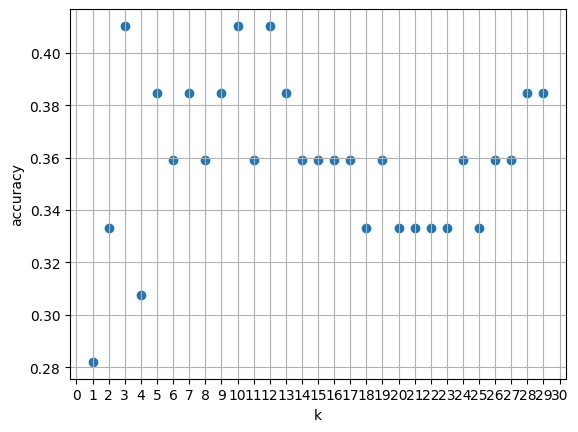

In [10]:
# Determing number of neighbors for KNN classifier
random.seed(42)

k_range = range(1, 30)
scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_train, y_train)
    scores.append(knn.score(X_test, y_test))
plt.figure()
plt.xlabel('k')
plt.ylabel('accuracy')
plt.scatter(k_range, scores)
plt.grid(True)
plt.xticks(list(range(31)))

Performing Cross-Validation...
Cross-Validation Scores: [0.47142857 0.44927536 0.43478261 0.44927536 0.46376812]
Mean Accuracy: 0.4537
Standard Deviation: 0.0127


Classification mode: KNN 

Accuracy on training set: 1.0 



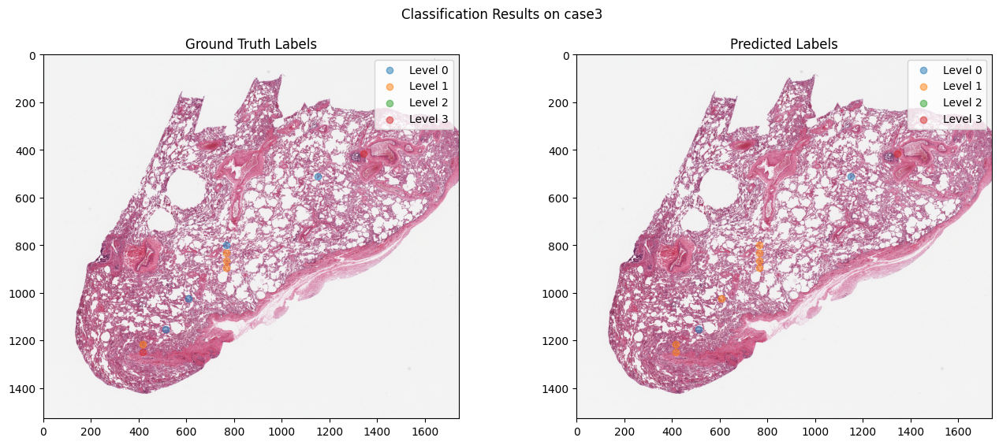

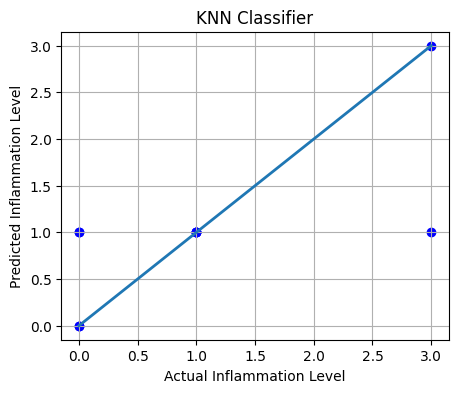

Accuracy on test set: 0.7 

Confusion matrix on test set: 
 [[2 2 0]
 [0 4 0]
 [0 1 1]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.50      0.67         4
           1       0.57      1.00      0.73         4
           3       1.00      0.50      0.67         2

    accuracy                           0.70        10
   macro avg       0.86      0.67      0.69        10
weighted avg       0.83      0.70      0.69        10
 



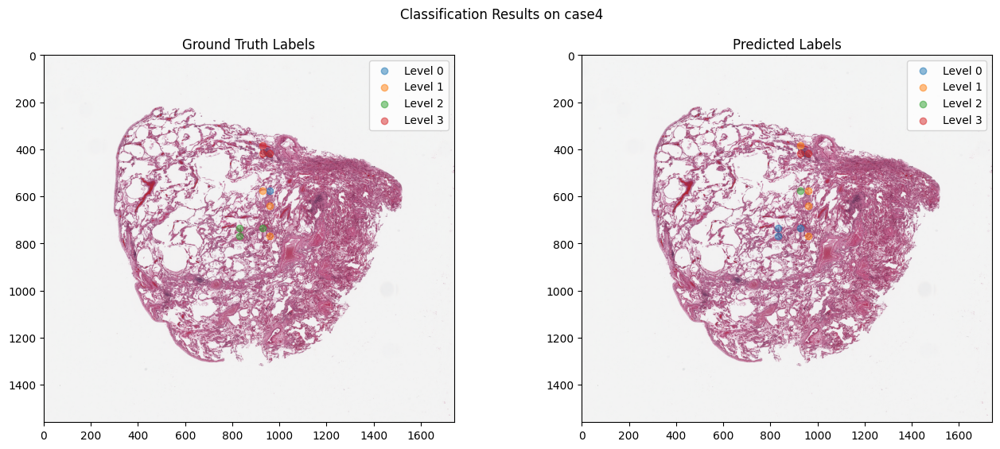

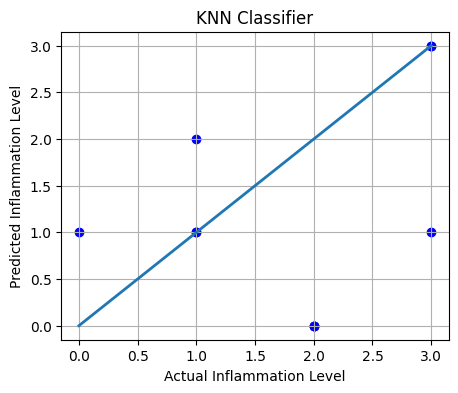

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 1 0]
 [3 0 0 0]
 [0 1 0 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.50      0.67      0.57         3
           2       0.00      0.00      0.00         3
           3       1.00      0.67      0.80         3

    accuracy                           0.40        10
   macro avg       0.38      0.33      0.34        10
weighted avg       0.45      0.40      0.41        10
 



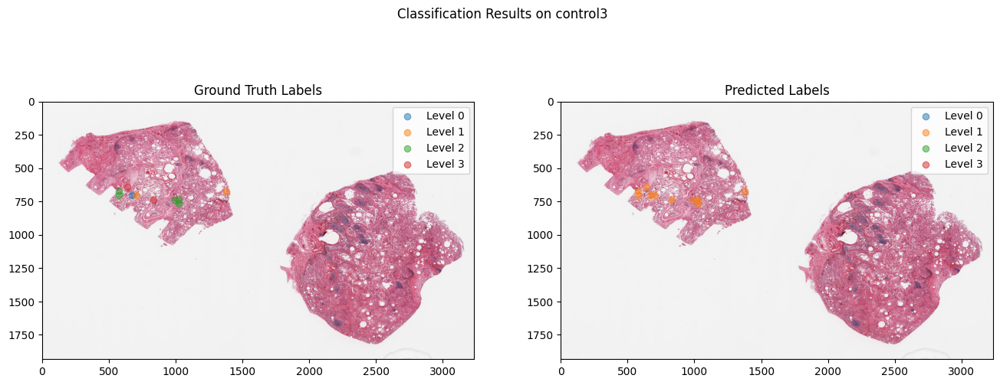

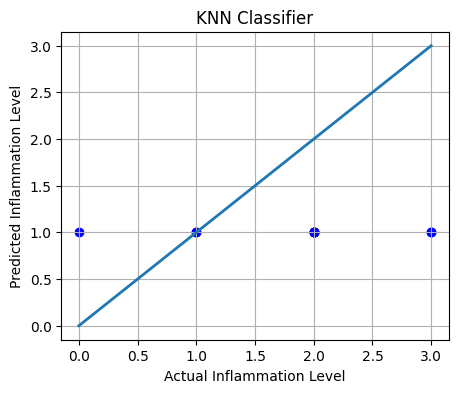

Accuracy on test set: 0.2 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [0 5 0 0]
 [0 2 0 0]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.20      1.00      0.33         2
           2       1.00      0.00      0.00         5
           3       1.00      0.00      0.00         2

    accuracy                           0.20        10
   macro avg       0.80      0.25      0.08        10
weighted avg       0.84      0.20      0.07        10
 



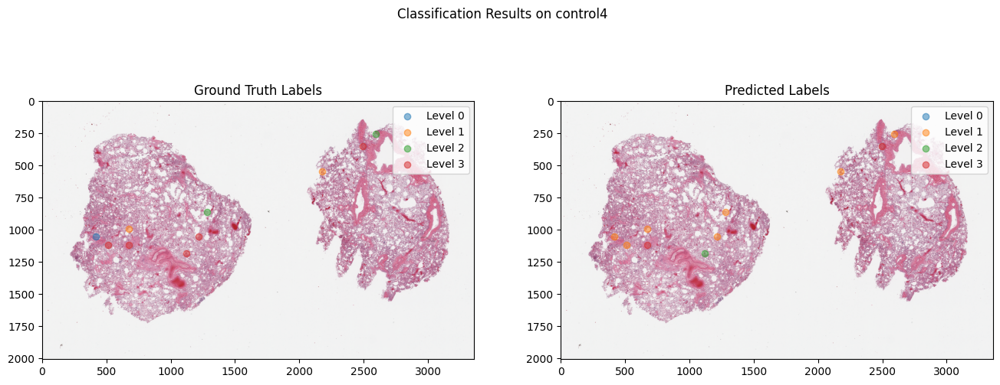

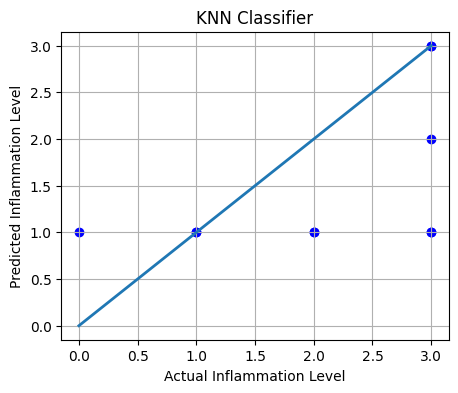

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [0 2 0 0]
 [0 2 1 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.29      1.00      0.44         2
           2       0.00      0.00      0.00         2
           3       1.00      0.40      0.57         5

    accuracy                           0.40        10
   macro avg       0.57      0.35      0.25        10
weighted avg       0.66      0.40      0.37        10
 



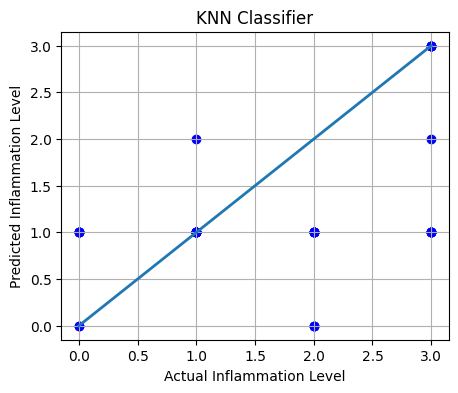

Accuracy on test set (all subsets): 0.425 

Confusion matrix on test set (all subsets): 
 [[ 2  5  0  0]
 [ 0 10  1  0]
 [ 3  7  0  0]
 [ 0  6  1  5]] 

Classification report on test set (all subsets): 
               precision    recall  f1-score   support

           0       0.40      0.29      0.33         7
           1       0.36      0.91      0.51        11
           2       0.00      0.00      0.00        10
           3       1.00      0.42      0.59        12

    accuracy                           0.42        40
   macro avg       0.44      0.40      0.36        40
weighted avg       0.47      0.42      0.38        40
 



In [155]:
# KNN; n_neighbors=15
counts_file_path = './updated_annotations.csv'
read_file_and_classify(counts_file_path, 'KNN', n_neighbors=15, cv=True)

# **Classification Results on Random Forest:**

Performing Cross-Validation...
Cross-Validation Scores: [0.54285714 0.44927536 0.4057971  0.55072464 0.47826087]
Mean Accuracy: 0.4854
Standard Deviation: 0.0552


Classification mode: RandomForest 

Accuracy on training set: 0.8901734104046243 



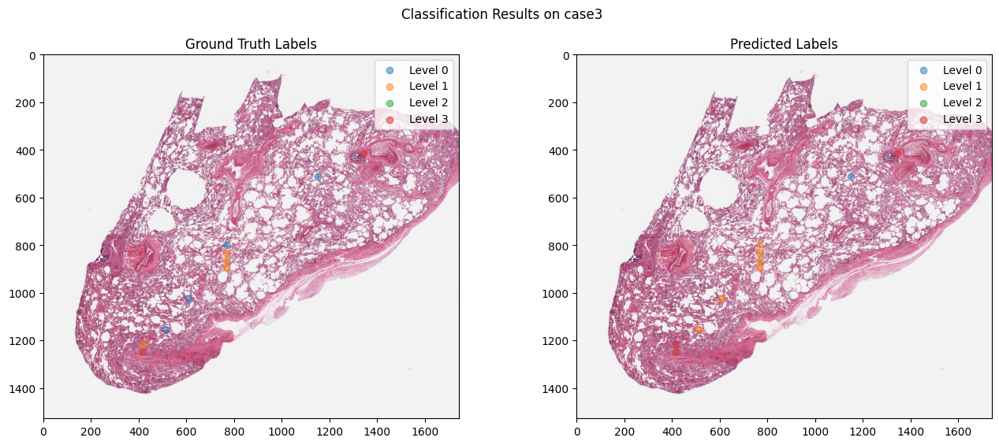

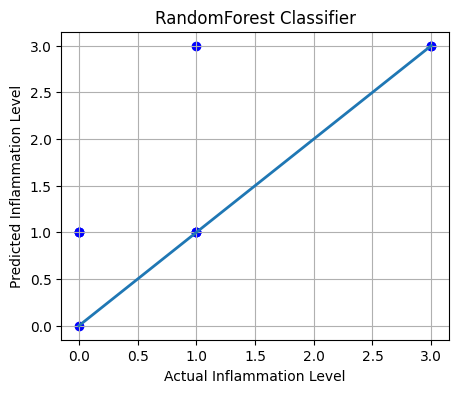

Accuracy on test set: 0.6 

Confusion matrix on test set: 
 [[1 3 0]
 [0 3 1]
 [0 0 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.25      0.40         4
           1       0.50      0.75      0.60         4
           3       0.67      1.00      0.80         2

    accuracy                           0.60        10
   macro avg       0.72      0.67      0.60        10
weighted avg       0.73      0.60      0.56        10
 



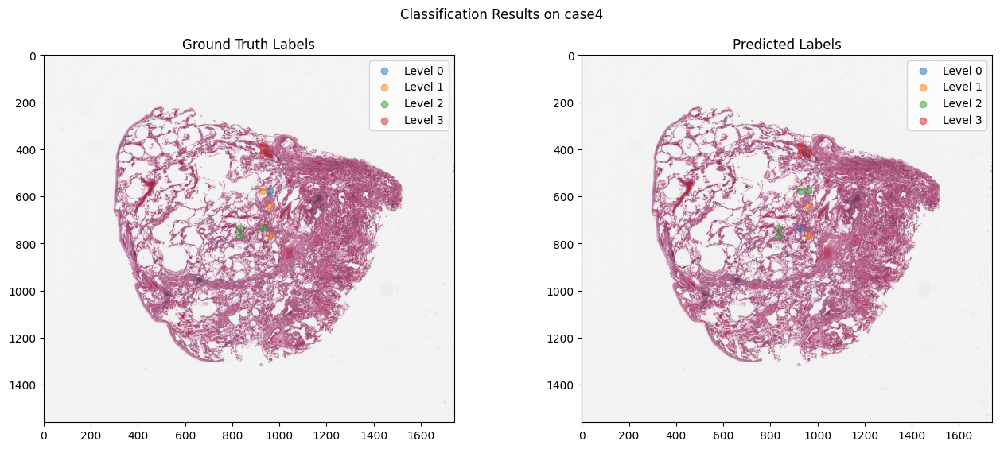

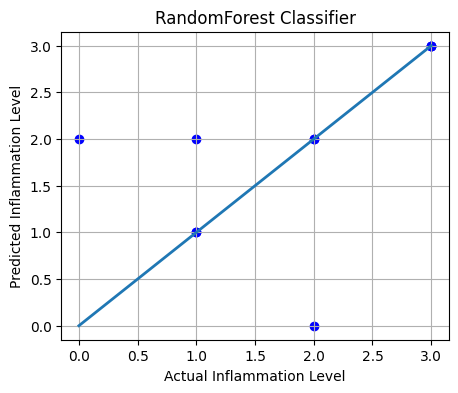

Accuracy on test set: 0.7 

Confusion matrix on test set: 
 [[0 0 1 0]
 [0 2 1 0]
 [1 0 2 0]
 [0 0 0 3]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       1.00      0.67      0.80         3
           2       0.50      0.67      0.57         3
           3       1.00      1.00      1.00         3

    accuracy                           0.70        10
   macro avg       0.62      0.58      0.59        10
weighted avg       0.75      0.70      0.71        10
 



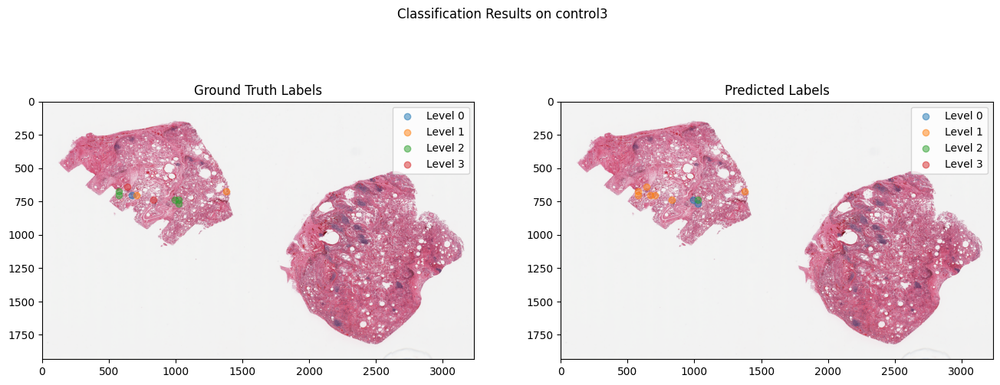

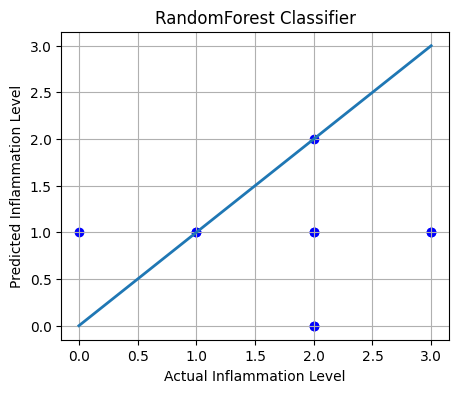

Accuracy on test set: 0.3 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [2 2 1 0]
 [0 2 0 0]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.29      1.00      0.44         2
           2       1.00      0.20      0.33         5
           3       1.00      0.00      0.00         2

    accuracy                           0.30        10
   macro avg       0.57      0.30      0.19        10
weighted avg       0.76      0.30      0.26        10
 



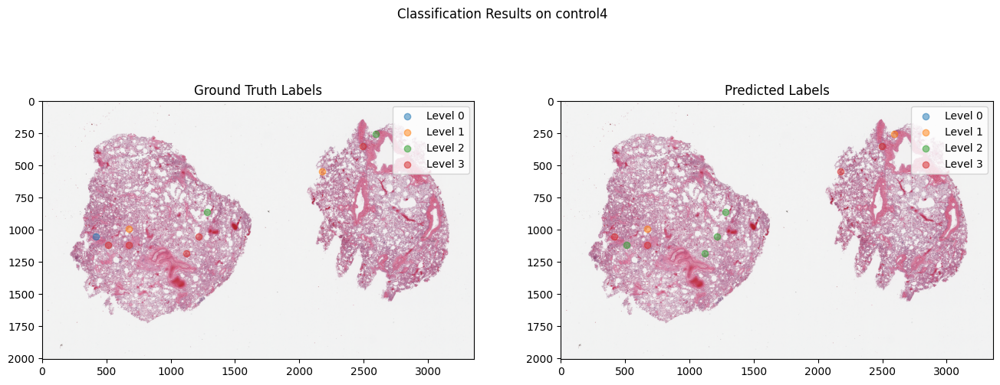

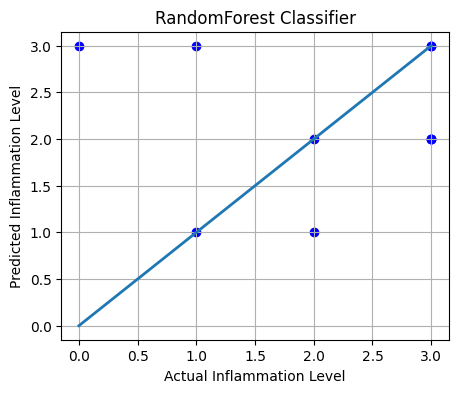

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[0 0 0 1]
 [0 1 0 1]
 [0 1 1 0]
 [0 0 3 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.50      0.50      0.50         2
           2       0.25      0.50      0.33         2
           3       0.50      0.40      0.44         5

    accuracy                           0.40        10
   macro avg       0.56      0.35      0.32        10
weighted avg       0.50      0.40      0.39        10
 



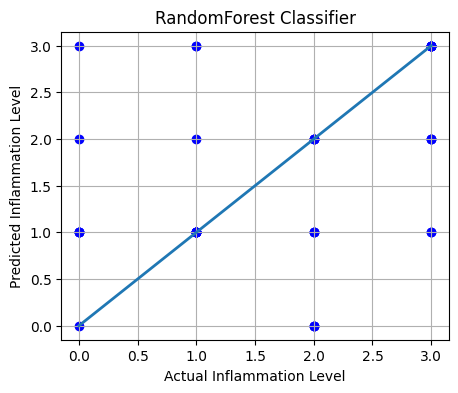

Accuracy on test set (all subsets): 0.5 

Confusion matrix on test set (all subsets): 
 [[1 4 1 1]
 [0 8 1 2]
 [3 3 4 0]
 [0 2 3 7]] 

Classification report on test set (all subsets): 
               precision    recall  f1-score   support

           0       0.25      0.14      0.18         7
           1       0.47      0.73      0.57        11
           2       0.44      0.40      0.42        10
           3       0.70      0.58      0.64        12

    accuracy                           0.50        40
   macro avg       0.47      0.46      0.45        40
weighted avg       0.49      0.50      0.49        40
 



In [158]:
# Random Forest
counts_file_path = './updated_annotations.csv'
read_file_and_classify(counts_file_path, 'RandomForest', n_neighbors=15, cv=True)

# **Classification Results for Decision Tree:**

Performing Cross-Validation...
Cross-Validation Scores: [0.34285714 0.43478261 0.47826087 0.46376812 0.34782609]
Mean Accuracy: 0.4135
Standard Deviation: 0.0574


Classification mode: DecisionTree 

Accuracy on training set: 0.9132947976878613 



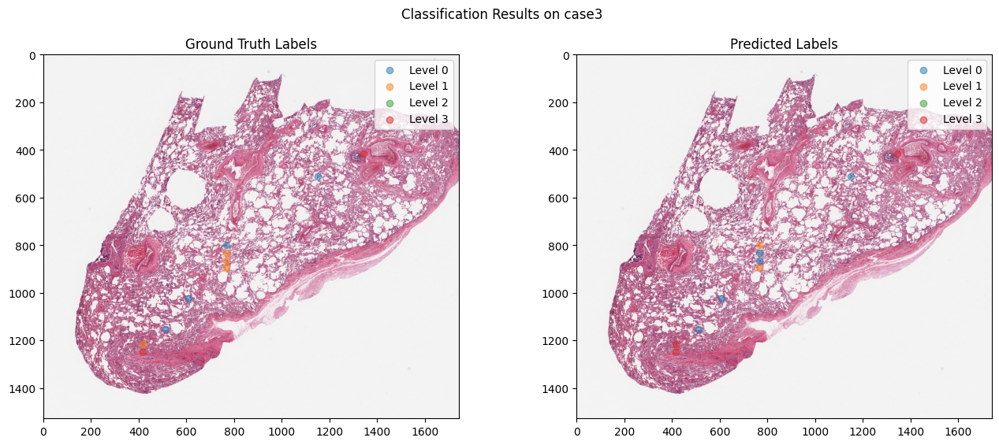

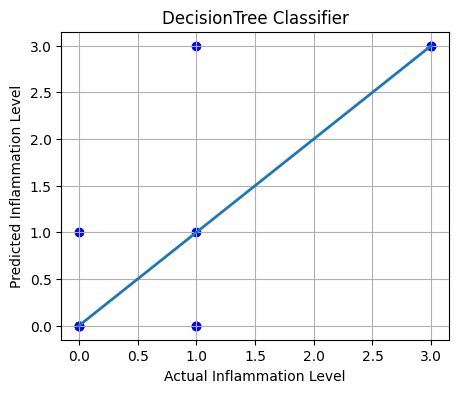

Accuracy on test set: 0.6 

Confusion matrix on test set: 
 [[3 1 0]
 [2 1 1]
 [0 0 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       0.60      0.75      0.67         4
           1       0.50      0.25      0.33         4
           3       0.67      1.00      0.80         2

    accuracy                           0.60        10
   macro avg       0.59      0.67      0.60        10
weighted avg       0.57      0.60      0.56        10
 



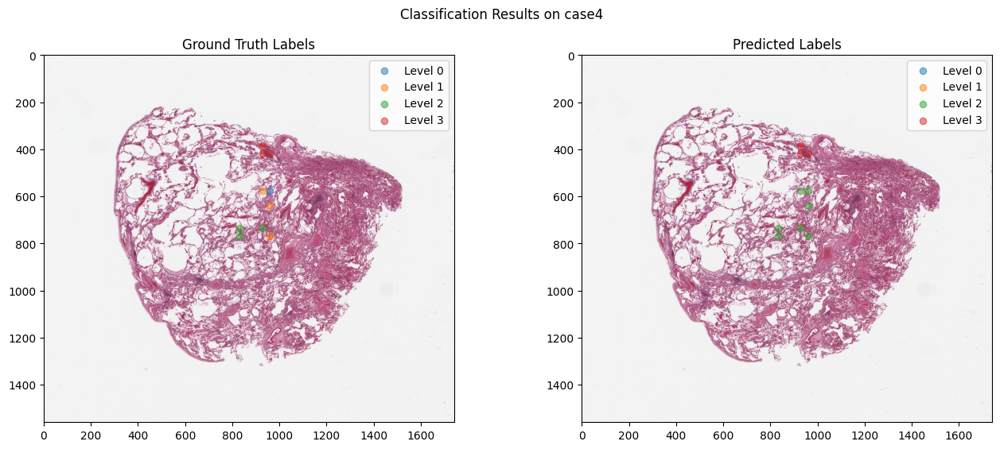

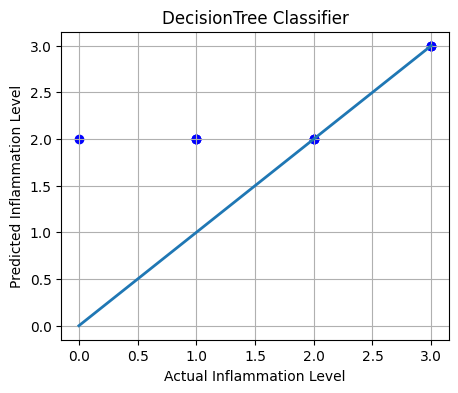

Accuracy on test set: 0.6 

Confusion matrix on test set: 
 [[0 0 1 0]
 [0 0 3 0]
 [0 0 3 0]
 [0 0 0 3]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       1.00      0.00      0.00         3
           2       0.43      1.00      0.60         3
           3       1.00      1.00      1.00         3

    accuracy                           0.60        10
   macro avg       0.86      0.50      0.40        10
weighted avg       0.83      0.60      0.48        10
 



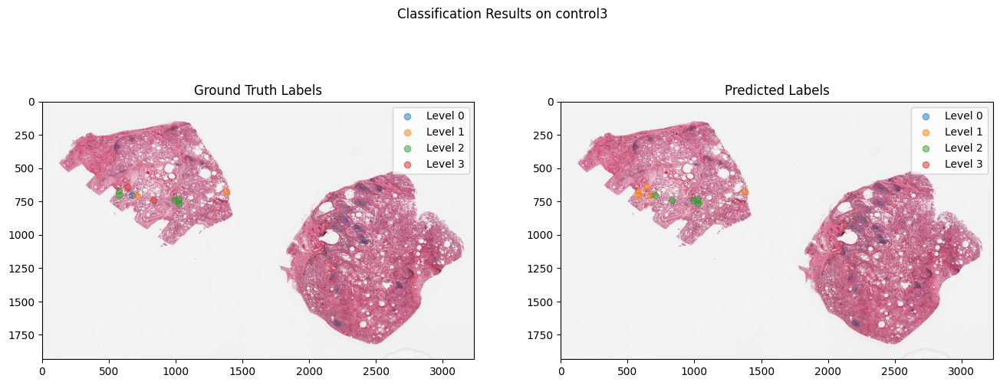

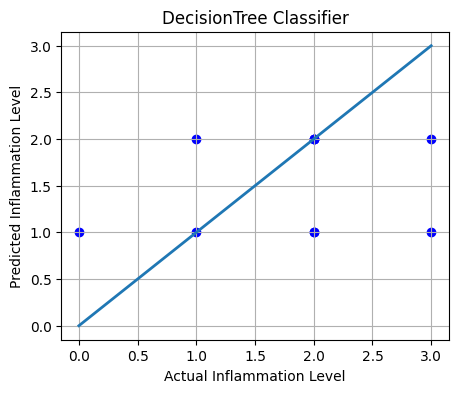

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 1 1 0]
 [0 2 3 0]
 [0 1 1 0]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.20      0.50      0.29         2
           2       0.60      0.60      0.60         5
           3       1.00      0.00      0.00         2

    accuracy                           0.40        10
   macro avg       0.70      0.28      0.22        10
weighted avg       0.64      0.40      0.36        10
 



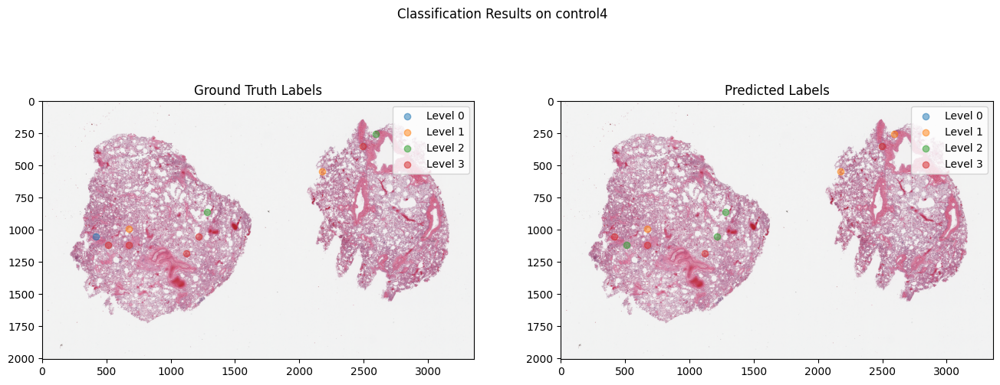

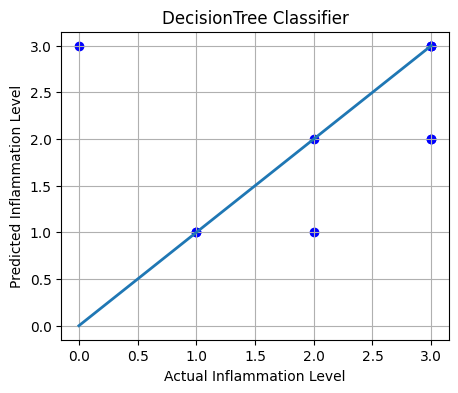

Accuracy on test set: 0.6 

Confusion matrix on test set: 
 [[0 0 0 1]
 [0 2 0 0]
 [0 1 1 0]
 [0 0 2 3]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.67      1.00      0.80         2
           2       0.33      0.50      0.40         2
           3       0.75      0.60      0.67         5

    accuracy                           0.60        10
   macro avg       0.69      0.53      0.47        10
weighted avg       0.68      0.60      0.57        10
 



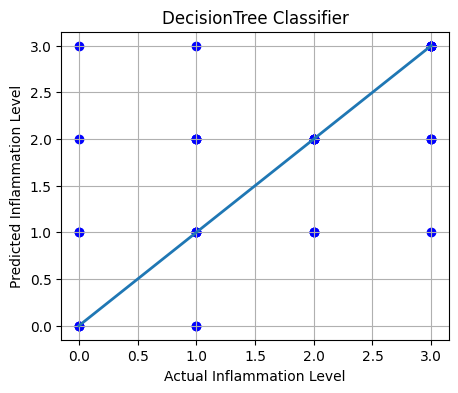

Accuracy on test set (all subsets): 0.55 

Confusion matrix on test set (all subsets): 
 [[3 2 1 1]
 [2 4 4 1]
 [0 3 7 0]
 [0 1 3 8]] 

Classification report on test set (all subsets): 
               precision    recall  f1-score   support

           0       0.60      0.43      0.50         7
           1       0.40      0.36      0.38        11
           2       0.47      0.70      0.56        10
           3       0.80      0.67      0.73        12

    accuracy                           0.55        40
   macro avg       0.57      0.54      0.54        40
weighted avg       0.57      0.55      0.55        40
 



In [159]:
# Decision Tree max_depth = 15, max_features=4
counts_file_path = './updated_annotations.csv'
read_file_and_classify(counts_file_path, 'DecisionTree', n_neighbors=15, cv=True)

Performing Cross-Validation...
Cross-Validation Scores: [0.51428571 0.34782609 0.33333333 0.36231884 0.37681159]
Mean Accuracy: 0.3869
Standard Deviation: 0.0653


Classification mode: DecisionTree 

Accuracy on training set: 0.9132947976878613 



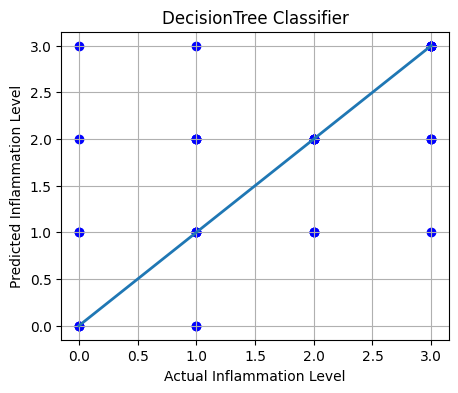

ValueError: multiclass format is not supported

In [30]:
# Decision Tree max_depth = 15, max_features=4
counts_file_path = './updated_annotations.csv'
read_file_and_classify(counts_file_path, 'DecisionTree', n_neighbors=15, cv=True)

# **Classification Results for SVM:**

Performing Cross-Validation...
Cross-Validation Scores: [0.5        0.50724638 0.56521739 0.44927536 0.52173913]
Mean Accuracy: 0.5087
Standard Deviation: 0.0373


Classification mode: SVM 

Accuracy on training set: 0.5549132947976878 



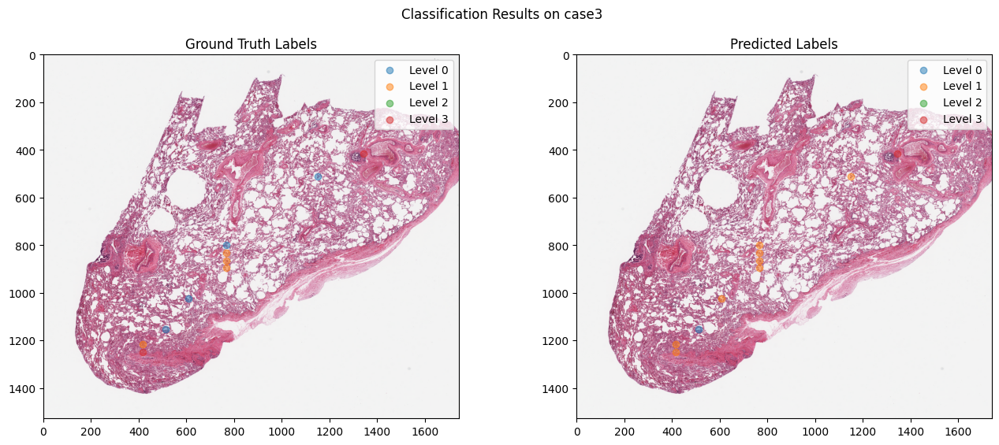

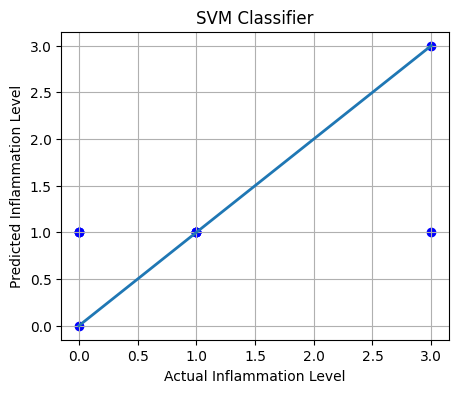

Accuracy on test set: 0.6 

Confusion matrix on test set: 
 [[1 3 0]
 [0 4 0]
 [0 1 1]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.25      0.40         4
           1       0.50      1.00      0.67         4
           3       1.00      0.50      0.67         2

    accuracy                           0.60        10
   macro avg       0.83      0.58      0.58        10
weighted avg       0.80      0.60      0.56        10
 



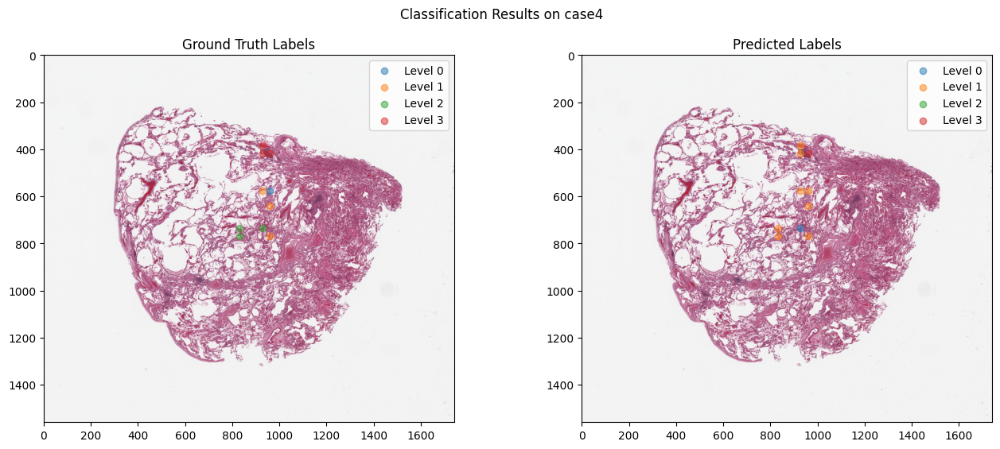

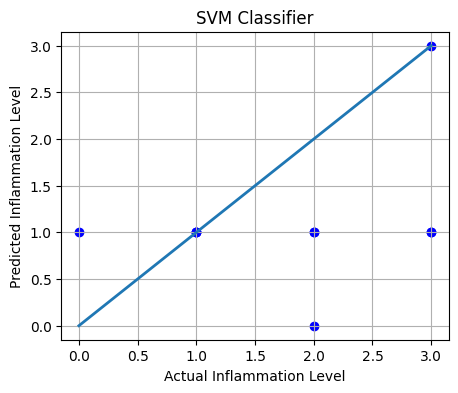

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 3 0 0]
 [1 2 0 0]
 [0 2 0 1]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.38      1.00      0.55         3
           2       1.00      0.00      0.00         3
           3       1.00      0.33      0.50         3

    accuracy                           0.40        10
   macro avg       0.59      0.33      0.26        10
weighted avg       0.71      0.40      0.31        10
 



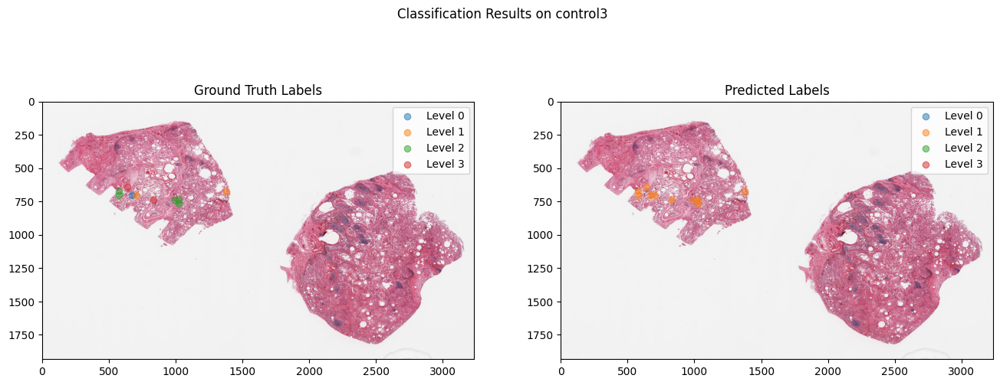

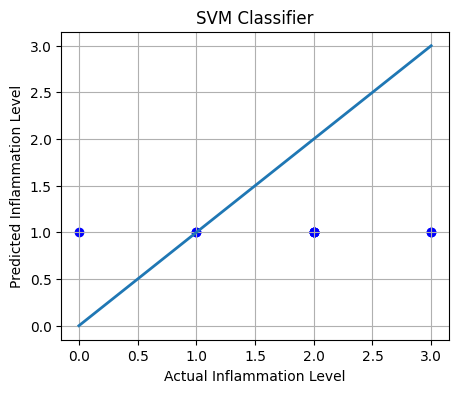

Accuracy on test set: 0.2 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [0 5 0 0]
 [0 2 0 0]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.20      1.00      0.33         2
           2       1.00      0.00      0.00         5
           3       1.00      0.00      0.00         2

    accuracy                           0.20        10
   macro avg       0.80      0.25      0.08        10
weighted avg       0.84      0.20      0.07        10
 



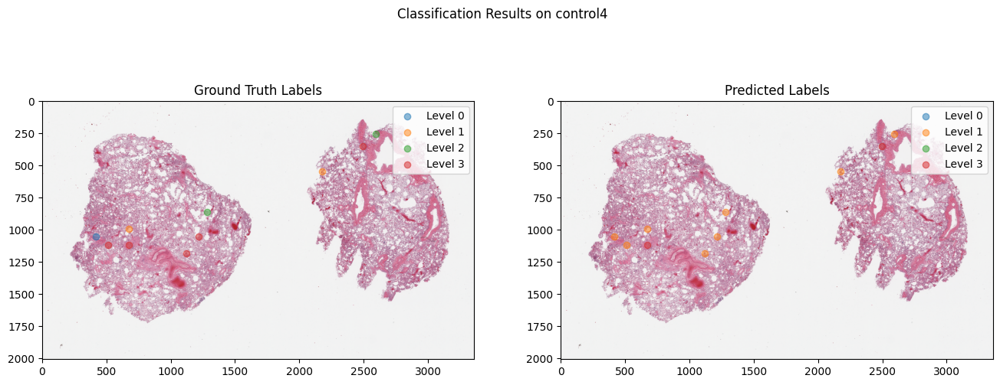

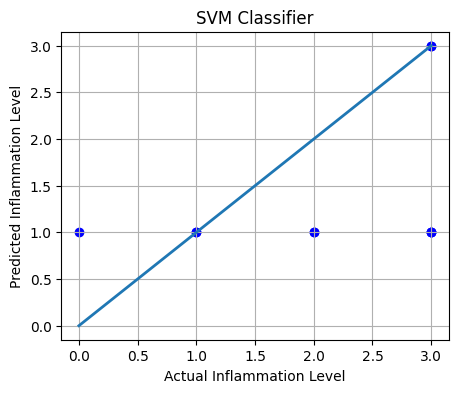

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [0 2 0 0]
 [0 3 0 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.25      1.00      0.40         2
           2       1.00      0.00      0.00         2
           3       1.00      0.40      0.57         5

    accuracy                           0.40        10
   macro avg       0.81      0.35      0.24        10
weighted avg       0.85      0.40      0.37        10
 



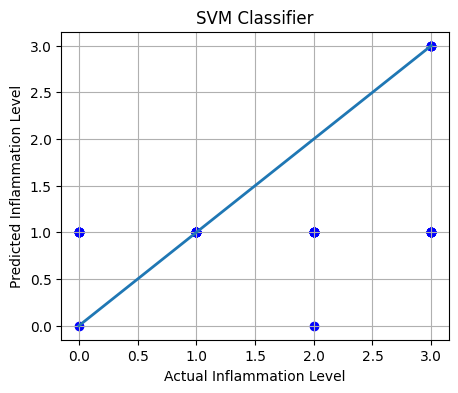

Accuracy on test set (all subsets): 0.4 

Confusion matrix on test set (all subsets): 
 [[ 1  6  0  0]
 [ 0 11  0  0]
 [ 1  9  0  0]
 [ 0  8  0  4]] 

Classification report on test set (all subsets): 
               precision    recall  f1-score   support

           0       0.50      0.14      0.22         7
           1       0.32      1.00      0.49        11
           2       1.00      0.00      0.00        10
           3       1.00      0.33      0.50        12

    accuracy                           0.40        40
   macro avg       0.71      0.37      0.30        40
weighted avg       0.73      0.40      0.32        40
 



In [161]:
# SVM with rbf kernel
counts_file_path = './updated_annotations.csv'
read_file_and_classify(counts_file_path, 'SVM', n_neighbors=15, cv=True)

# **Classification Results for QDA:**

Performing Cross-Validation...
Cross-Validation Scores: [0.38571429 0.43478261 0.47826087 0.55072464 0.43478261]
Mean Accuracy: 0.4569
Standard Deviation: 0.0553


Classification mode: QDA 

Accuracy on training set: 0.5115606936416185 



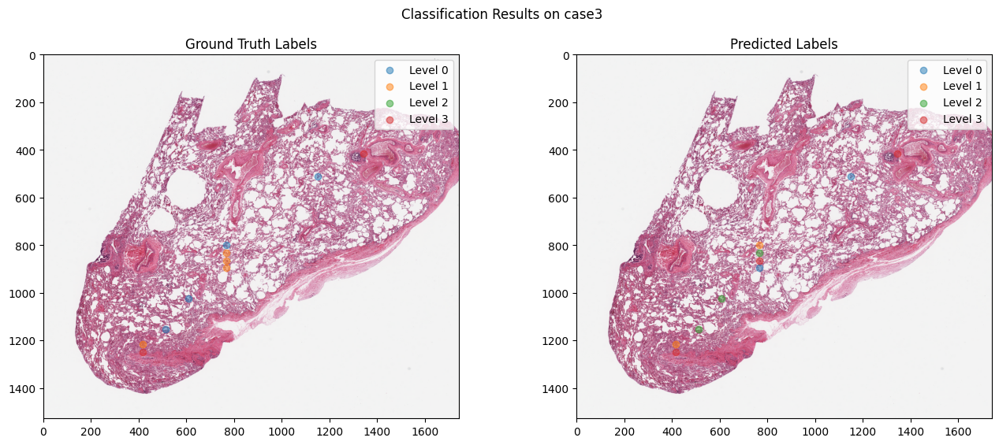

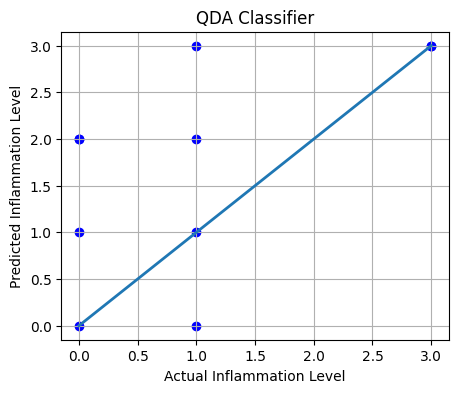

Accuracy on test set: 0.4 

Confusion matrix on test set: 
 [[1 1 2 0]
 [1 1 1 1]
 [0 0 0 0]
 [0 0 0 2]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       0.50      0.25      0.33         4
           1       0.50      0.25      0.33         4
           2       0.00      1.00      0.00         0
           3       0.67      1.00      0.80         2

    accuracy                           0.40        10
   macro avg       0.42      0.62      0.37        10
weighted avg       0.53      0.40      0.43        10
 



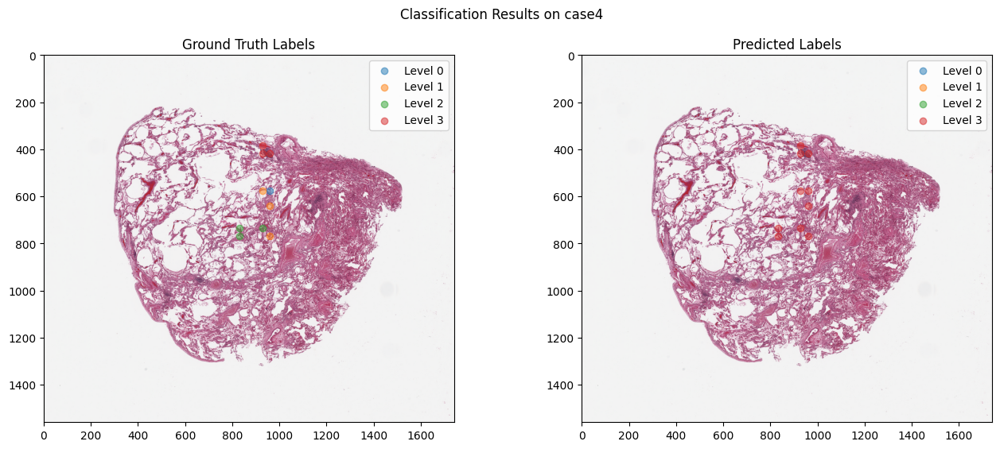

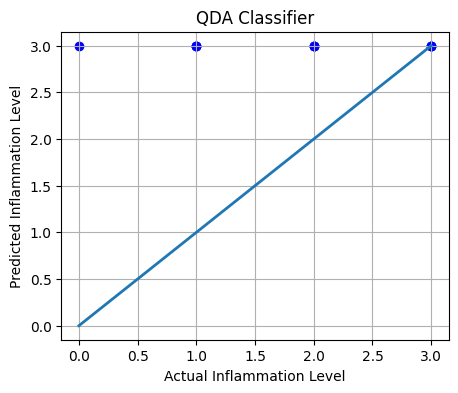

Accuracy on test set: 0.3 

Confusion matrix on test set: 
 [[0 0 0 1]
 [0 0 0 3]
 [0 0 0 3]
 [0 0 0 3]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       1.00      0.00      0.00         3
           2       1.00      0.00      0.00         3
           3       0.30      1.00      0.46         3

    accuracy                           0.30        10
   macro avg       0.82      0.25      0.12        10
weighted avg       0.79      0.30      0.14        10
 



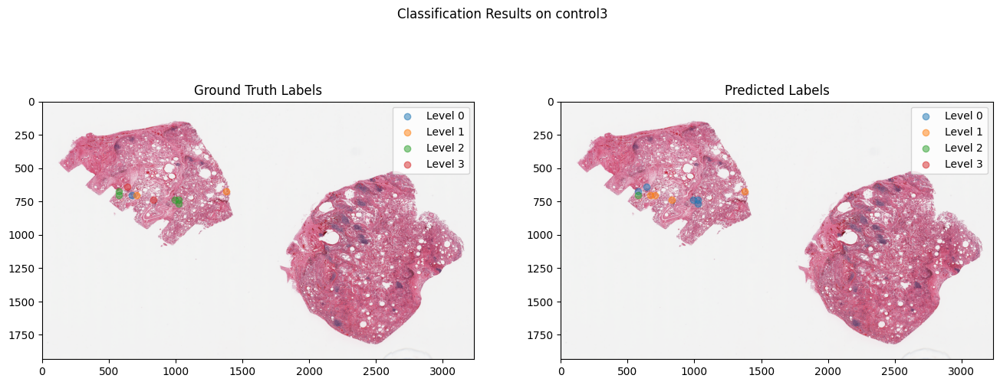

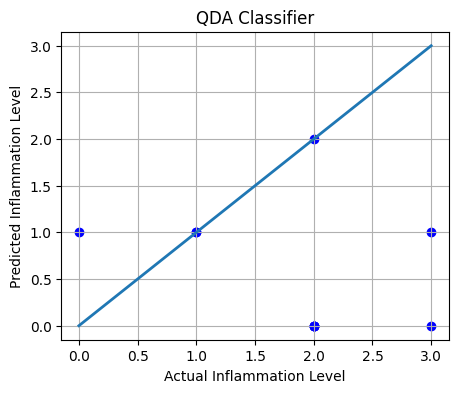

Accuracy on test set: 0.3 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [4 0 1 0]
 [1 1 0 0]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.50      1.00      0.67         2
           2       1.00      0.20      0.33         5
           3       1.00      0.00      0.00         2

    accuracy                           0.30        10
   macro avg       0.62      0.30      0.25        10
weighted avg       0.80      0.30      0.30        10
 



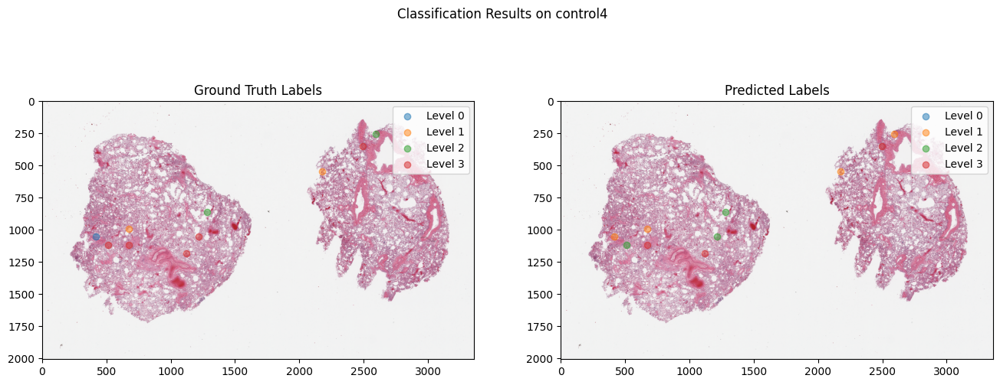

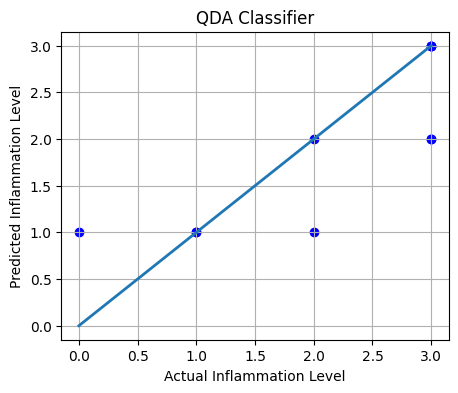

Accuracy on test set: 0.6 

Confusion matrix on test set: 
 [[0 1 0 0]
 [0 2 0 0]
 [0 1 1 0]
 [0 0 2 3]] 

Classification report on test set: 
               precision    recall  f1-score   support

           0       1.00      0.00      0.00         1
           1       0.50      1.00      0.67         2
           2       0.33      0.50      0.40         2
           3       1.00      0.60      0.75         5

    accuracy                           0.60        10
   macro avg       0.71      0.53      0.45        10
weighted avg       0.77      0.60      0.59        10
 



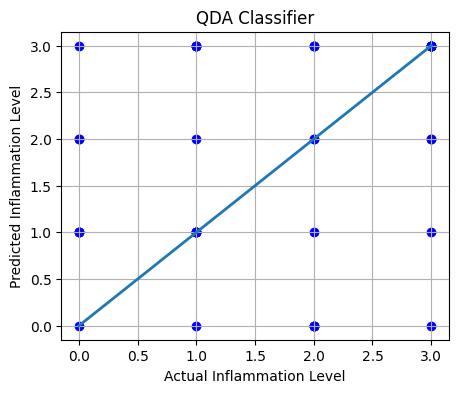

Accuracy on test set (all subsets): 0.4 

Confusion matrix on test set (all subsets): 
 [[1 3 2 1]
 [1 5 1 4]
 [4 1 2 3]
 [1 1 2 8]] 

Classification report on test set (all subsets): 
               precision    recall  f1-score   support

           0       0.14      0.14      0.14         7
           1       0.50      0.45      0.48        11
           2       0.29      0.20      0.24        10
           3       0.50      0.67      0.57        12

    accuracy                           0.40        40
   macro avg       0.36      0.37      0.36        40
weighted avg       0.38      0.40      0.39        40
 



In [162]:
# QDA
counts_file_path = './updated_annotations.csv'
read_file_and_classify(counts_file_path, 'QDA', n_neighbors=15, cv=True)